<a href="https://colab.research.google.com/github/kwanglo/lookinbody_test/blob/master/inbody_data_handling_carrot_tf2_sorted_mealCat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#구글 드라이브와 연동
from google.colab import drive
drive.mount('/gdrive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /gdrive


In [2]:
#사용 라이브러리 import
from IPython.display import display
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
import pandas as pd
import os
import datetime

In [3]:
#공유폴더에서 해당 directory로 바로가기 추가 후 진행
path = '/gdrive/My Drive/Colab Notebooks/사진 자료'
path_save = '/gdrive/My Drive/Colab Notebooks/lookinbody_test'

## 사용자 및 사진 정보 추출

1. 디렉토리에서 폴더 이름 추출<br>
2. 각 폴더에서 사진정보에 따라 촬영날짜, 시간 추출

In [61]:
#사용자 정보 추출 후 .DS_Store 삭제
user_name = pd.DataFrame(os.listdir(path))
user_name.columns = ['userID']
user_name = user_name[user_name.userID != '.DS_Store']
#필요 시 userID 순서대로 정렬 ==> 불필요한 경우 주석처리
user_name.sort_values(by=['userID'], axis=0, inplace=True)
user_name = user_name.reset_index(drop=True)

path_temp = path + "/" + user_name[['userID'][0]]

In [6]:
#각 사용자별 사진 이름을 포함하는 테이블 생성 // 전체 데이터
#최종 데이터 테이블 생성
df_table = pd.DataFrame()
#df_table.columns = ['file_name','userID','date_info','meal_category']

for i in range(0,len(path_temp)):
  #각 userID에 따라 파일명 구하기
  file_name_temp = pd.DataFrame(os.listdir(path_temp[i]))
  file_name_temp.columns = ['col_temp']
  file_name_temp = file_name_temp[file_name_temp.col_temp != '.DS_Store']
  #file_name_temp.columns = [user_name[['userID'][0]][i]]
  
  #임시 테이블 생성
  df_temp = pd.DataFrame()
  #파일명과 유저ID 입력
  df_temp['file_name'] = file_name_temp['col_temp']
  df_temp['userID'] = user_name[['userID'][0]][i]
  #파일명에서 시간정보 추출
  df_temp['date_info'] = df_temp['file_name'].str.slice(stop=12)
  df_temp['date_info'] = pd.to_datetime(df_temp.date_info, format='%Y%m%d%H%M', errors='ignore')
  
  #식사 시간 기준으로 meal_category 생성
  #06~10시 아침
  #11~16시 점심
  #17~21시 저녁
  #21~05시 야식
  df_temp['meal_category'] = '미분류'
  #
  df_temp.loc[(df_temp['date_info'].dt.hour > 5) & (df_temp['date_info'].dt.hour <= 10), 'meal_category'] = '아침'
  df_temp.loc[(df_temp['date_info'].dt.hour > 10) & (df_temp['date_info'].dt.hour <= 16), 'meal_category'] = '점심'
  df_temp.loc[(df_temp['date_info'].dt.hour > 16) & (df_temp['date_info'].dt.hour <= 20), 'meal_category'] = '저녁'
  df_temp.loc[(df_temp['date_info'].dt.hour > 20) | (df_temp['date_info'].dt.hour <= 5), 'meal_category'] = '야식'

  df_table = pd.concat([df_table, df_temp],ignore_index=True)

In [9]:
#타겟 사용자 지정
user_num_temp = 0 #len(path_temp) -1
img_path = path_temp[user_num_temp]

In [10]:
img_path

'/gdrive/My Drive/Colab Notebooks/사진 자료/1000072'

In [12]:
import glob  # finding image paths
from skimage.io import imread  # reading images
from skimage.transform import resize  # resizing images
import PIL
import PIL.Image

In [131]:
#평가할 사용자 폴더에 있는 파일 리스트
img_list = sorted(glob.glob(img_path+'/*.png'))

target_image_num = 0 #len(img_list) - 1 # 타겟 이미지 인덱스

#img_list로부터 현재 입력중인 사용자 정보 확인
current_userID = img_path.split('/')
current_userID = current_userID[len(current_userID)-1]
#타겟 사용자의 데이터만 별도로 추출
current_userInfo = df_table.loc[df_table.userID == current_userID]
current_userInfo = current_userInfo.reset_index()

current_userInfo['url'] = img_list
current_userInfo = current_userInfo.drop(labels='index',axis=1)
target_table = current_userInfo

In [132]:
#target와 input path 조정
target_mealCatNum = target_image_num # 타겟 이미지의 식사분류 지정
target_mealCat = target_table['meal_category'][target_mealCatNum] 
target_table_input = target_table.drop(index=target_mealCatNum, axis=0)
test_input_df = target_table_input.loc[target_table_input.meal_category == target_mealCat].reset_index().drop(labels='index',axis=1)

In [88]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

!pip -q install tensorflow-hub
import tensorflow_hub as hub

In [95]:
#이미지 저장 링크 지정
target_image_url = target_table['url'][target_image_num]
input_image_urls = test_input_df['url']

In [96]:
target_image_url

'/gdrive/My Drive/Colab Notebooks/사진 자료/1000072/20190905073849.png'

In [98]:
#필요시 타겟 이미지 확인
#PIL.Image.open(str(target_image_url))

In [99]:
target_image_path = target_image_url
input_img_paths = input_image_urls

integrated_path = np.append(target_image_path,input_img_paths)

In [101]:
#imageNet을 활용한 inception version 3 사용
hub_module_url = "https://tfhub.dev/google/imagenet/inception_v3/feature_vector/4"

In [102]:
#분류 모델 제작 - 최종적으로 입력벡터와 유사도 반환
def build_graph(hub_module_url, target_image_path):
  # Step 1) Prepare pre-trained model for extracting image features.
  module = hub.KerasLayer(hub_module_url)
  height = 229
  width = 229
  CHANNELS = 3
  # Copied a method of https://github.com/GoogleCloudPlatform/cloudml-samples/blob/bf0680726/flowers/trainer/model.py#L181
  # and fixed for all type images (not only jpeg)
  def decode_and_resize(image_str_tensor):
    """Decodes jpeg string, resizes it and returns a uint8 tensor."""
    image = tf.image.decode_image(image_str_tensor, channels=CHANNELS)
    # Note resize expects a batch_size, but tf_map supresses that index,
    # thus we have to expand then squeeze.  Resize returns float32 in the
    # range [0, uint8_max]
    image = tf.expand_dims(image, 0)
    image = tf.image.resize_bilinear(
        image, [height, width], align_corners=False)
    image = tf.squeeze(image, squeeze_dims=[0])
    image = tf.cast(image, dtype=tf.uint8)
    return image

  def to_img_feature(images):
    """Extract the feature of image vectors"""
    outputs = module(images)
    return outputs

  # Step 2) Extract image features of the target image.
  target_image_bytes = tf.gfile.GFile(target_image_path, 'rb').read()
  target_image = tf.constant(target_image_bytes, dtype=tf.string)
  target_image = decode_and_resize(target_image)
  target_image = tf.image.convert_image_dtype(target_image, dtype=tf.float32)
  target_image = tf.expand_dims(target_image, 0)
  target_image = to_img_feature(target_image)

  # Step 3) Extract image features of input images.
  input_byte = tf.placeholder(tf.string, shape=[None])
  input_image = tf.map_fn(decode_and_resize, input_byte, back_prop=False, dtype=tf.uint8)
  input_image = tf.image.convert_image_dtype(input_image, dtype=tf.float32)
  input_image = to_img_feature(input_image)

  # Step 4) Compare cosine_similarities of the target image and the input images.
  dot = tf.tensordot(target_image, tf.transpose(input_image), 1)
  similarity = dot / (tf.norm(target_image, axis=1) * tf.norm(input_image, axis=1))
  similarity = tf.reshape(similarity, [-1])
  
  return input_byte, similarity

In [103]:
#Step5 -- Run
#Compar target and input image
import time
from IPython.display import Image, display
#tf.logging.set_verbosity(tf.logging.ERROR)

# Load bytes of image files
image_bytes = [open(name, 'rb').read()
               for name in integrated_path]

In [104]:
with tf.Graph().as_default():
  input_byte, similarity_op = build_graph(hub_module_url, target_image_path)
  
  with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    t0 = time.time() # for time check
    
    # Inference similarities
    similarities = sess.run(similarity_op, feed_dict={input_byte: image_bytes})
    
    print("%d images inference time: %.2f s" % (len(similarities), time.time() - t0))

26 images inference time: 6.86 s


In [105]:
from IPython.display import Image

In [106]:
similarities

array([1.0000001 , 0.6573613 , 0.7190391 , 0.7257723 , 0.6561382 ,
       0.5517622 , 0.764027  , 0.65635175, 0.7802492 , 0.79513526,
       0.65831226, 0.5816677 , 0.70557404, 0.5772106 , 0.6765594 ,
       0.70690703, 0.79583347, 0.80931956, 0.7556064 , 0.7826451 ,
       0.7940564 , 0.84511614, 0.7202789 , 0.7069204 , 0.8393449 ,
       0.8021824 ], dtype=float32)

??????

In [133]:
#실제 출력에 활용한 이미지 리스트 제작
test_input_df['similarity'] = similarities[1:len(similarities)] #타겟사진을 제외한 유사도 추출
test_input_df = test_input_df.sort_values(by=['similarity'],ascending=False).reset_index().drop(labels='index',axis=1) # 높은 순으로 정렬

In [135]:
test_input_df

,file_name,userID,date_info,meal_category,url,similarity
0,20190928081340.png,1000072,2019-09-28 08:13:00,아침,/gdrive/My Drive/Colab Notebooks/사진 자료/10...,0.845116
1,20191001072056.png,1000072,2019-10-01 07:20:00,아침,/gdrive/My Drive/Colab Notebooks/사진 자료/10...,0.839345
2,20190923070500.png,1000072,2019-09-23 07:05:00,아침,/gdrive/My Drive/Colab Notebooks/사진 자료/10...,0.809320
3,20191002073237.png,1000072,2019-10-02 07:32:00,아침,/gdrive/My Drive/Colab Notebooks/사진 자료/10...,0.802182
4,20190922090725.png,1000072,2019-09-22 09:07:00,아침,/gdrive/My Drive/Colab Notebooks/사진 자료/10...,0.795833
...,...,...,...,...,...,...
20,20190912061624.png,1000072,2019-09-12 06:16:00,아침,/gdrive/My Drive/Colab Notebooks/사진 자료/10...,0.656352
21,20190909062055.png,1000072,2019-09-09 06:20:00,아침,/gdrive/My Drive/Colab Notebooks/사진 자료/10...,0.656138
22,20190916070322.png,1000072,2019-09-16 07:03:00,아침,/gdrive/My Drive/Colab Notebooks/사진 자료/10...,0.581668
23,20190919062142.png,1000072,2019-09-19 06:21:00,아침,/gdrive/My Drive/Colab Notebooks/사진 자료/10...,0.577211


In [136]:
#실제 출력에 활용한 이미지 리스트 제작
sorted_img_path = np.array(test_input_df['url'][0:5]) #상위 n개 추출
sorted_sim = np.array(test_input_df['similarity'][0:5]) #상위 n개 추출

# Target image


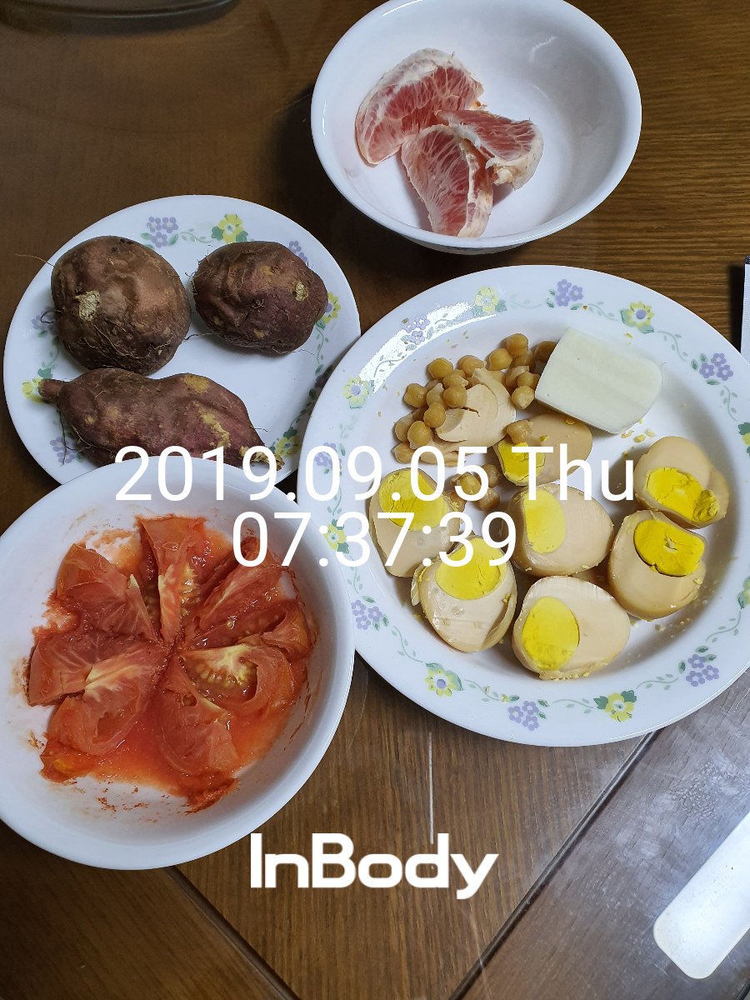

- similarity: 1.00
# Input images


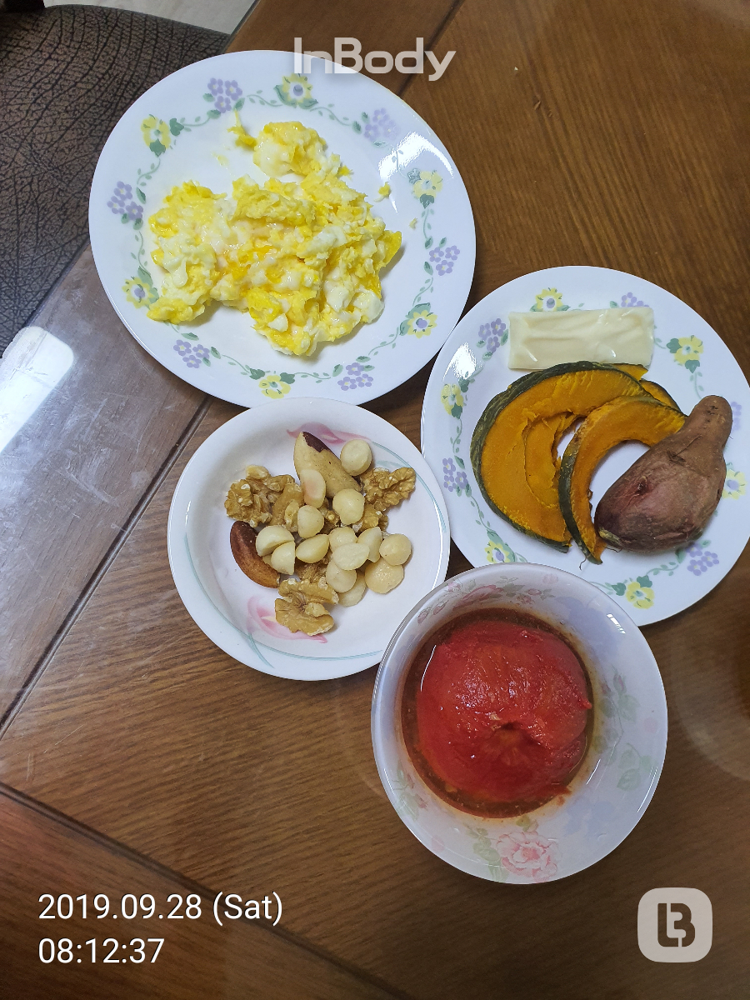

- similarity: 0.85


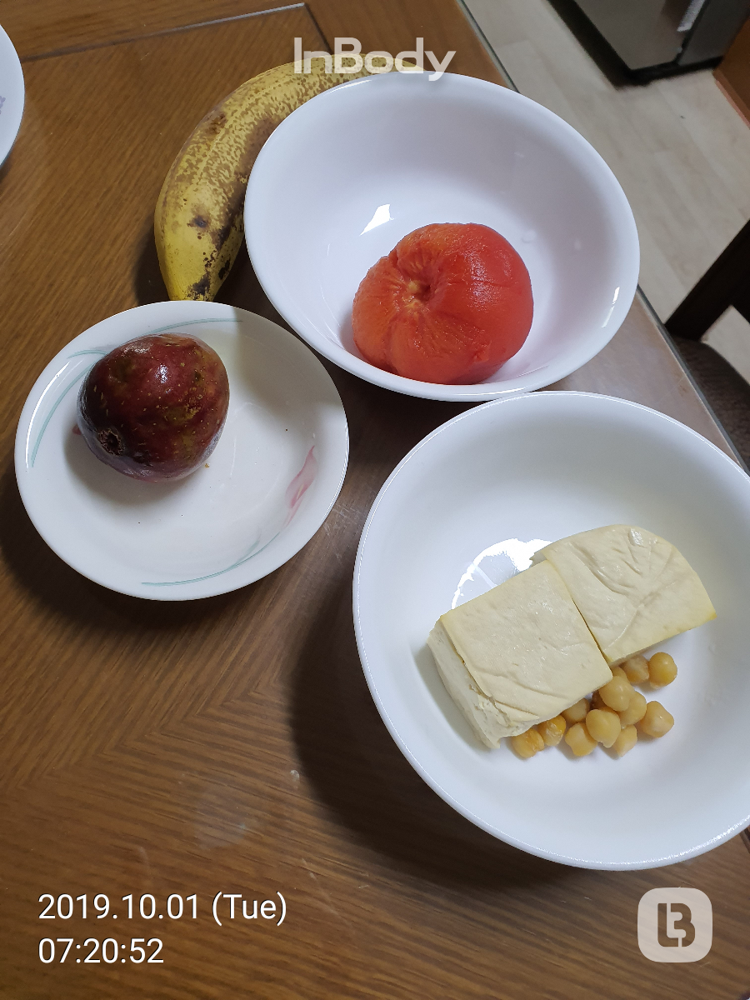

- similarity: 0.84


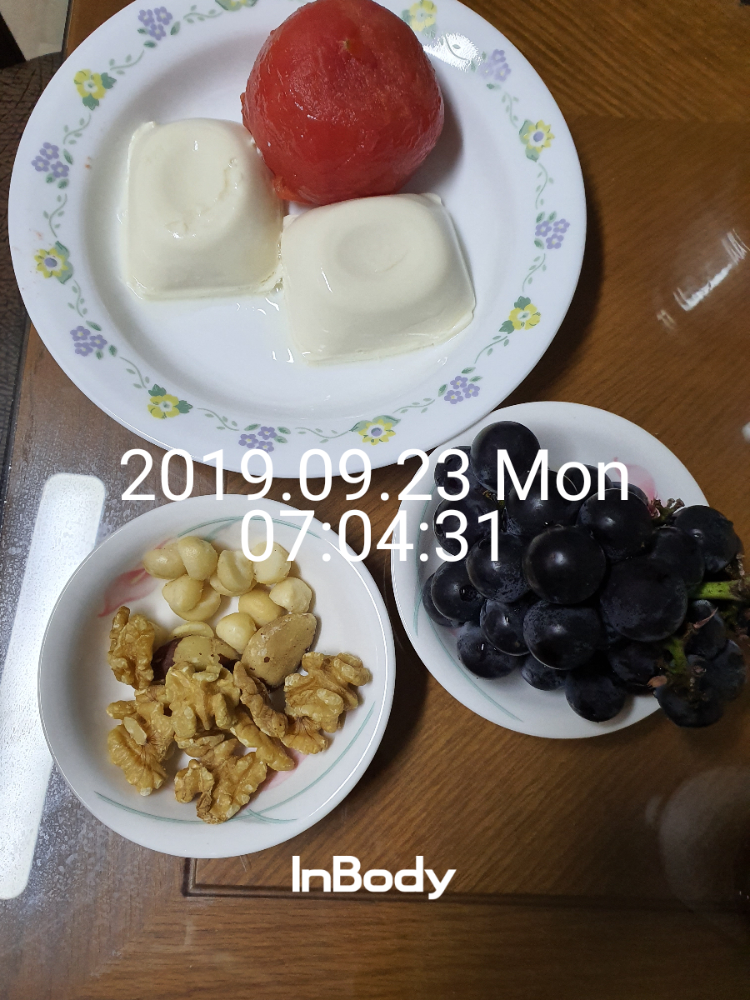

- similarity: 0.81


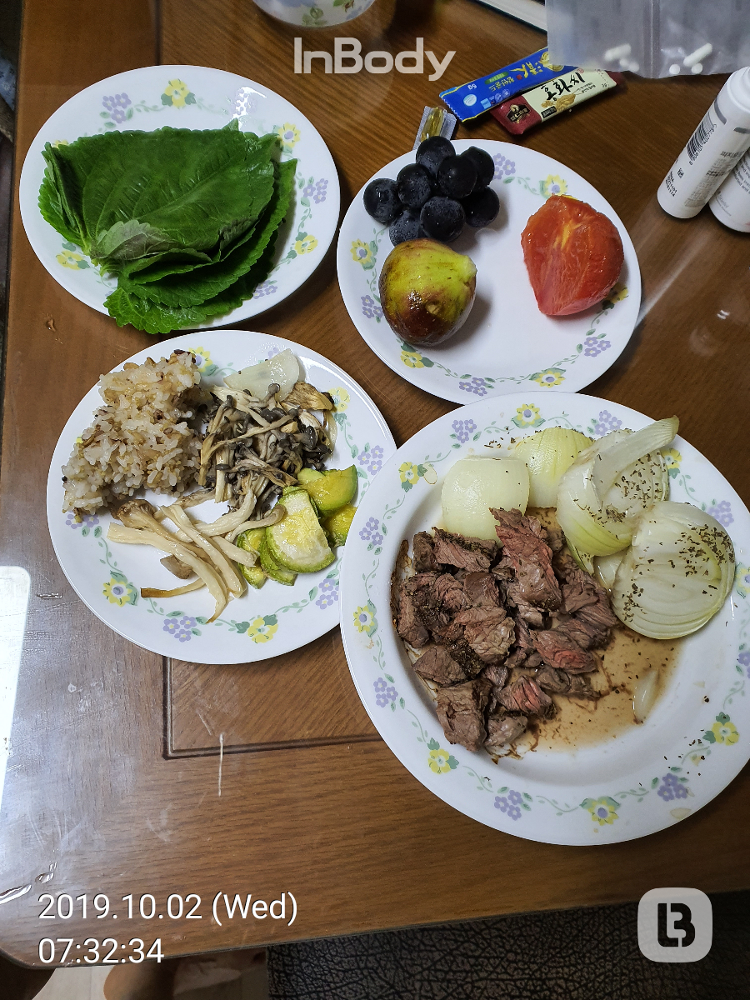

- similarity: 0.80


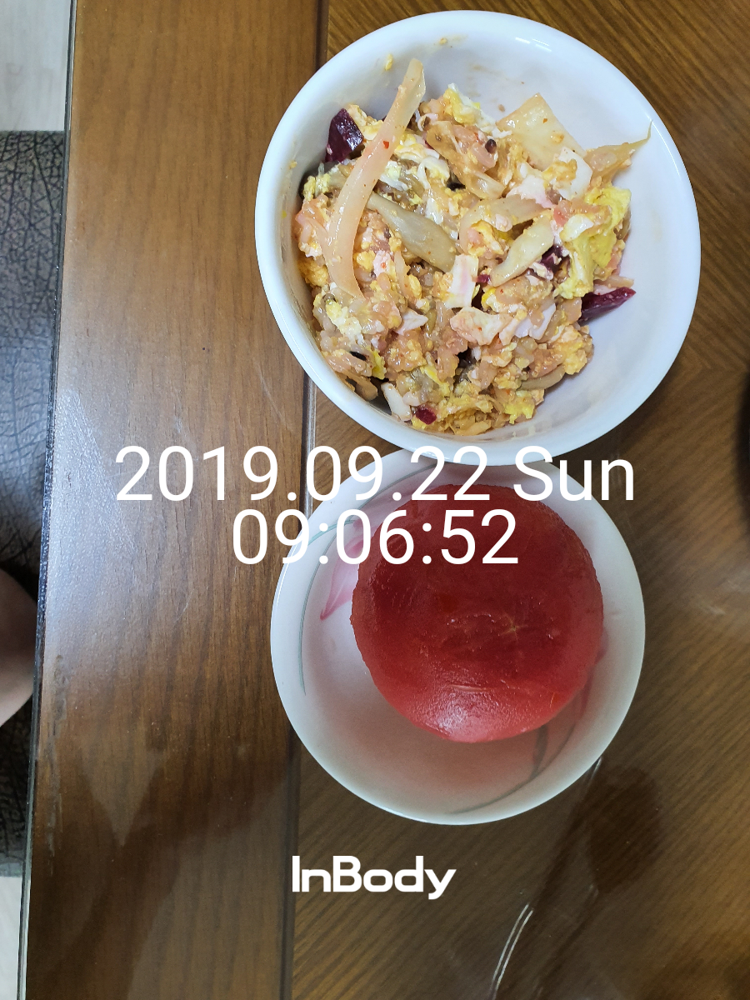

- similarity: 0.80


In [139]:
# Display results
print("# Target image")
#display(Image(target_img_path), )
display(Image(filename = target_image_path, width = 300, height = 300))
print("- similarity: %.2f" % similarities[0])

print("# Input images")
for similarity, sorted_img_path in zip(sorted_sim, sorted_img_path):
  display(Image(filename = sorted_img_path, width = 300, height = 300))  
  print("- similarity: %.2f" % similarity)